<a href="https://colab.research.google.com/github/ByronJayJee/pic2pick/blob/master/encode_photos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Connect to Google Drive

In [0]:
from google.colab import drive

In [0]:
drive.mount('/content/gdrive')

Locate Images on Drive

In [4]:
%cd /content/gdrive/My\ Drive/Photo_Backup

/content/gdrive/My Drive/Photo_Backup


Display a given image 

In [5]:
# Load PIL
!pip install rawpy
from PIL import Image
import rawpy
from IPython.display import display # to display images

     |████████████████████████████████| 686kB 2.8MB/s 


<PIL.MpoImagePlugin.MpoImageFile image mode=RGB size=1024x682 at 0x7F34D84C5898>


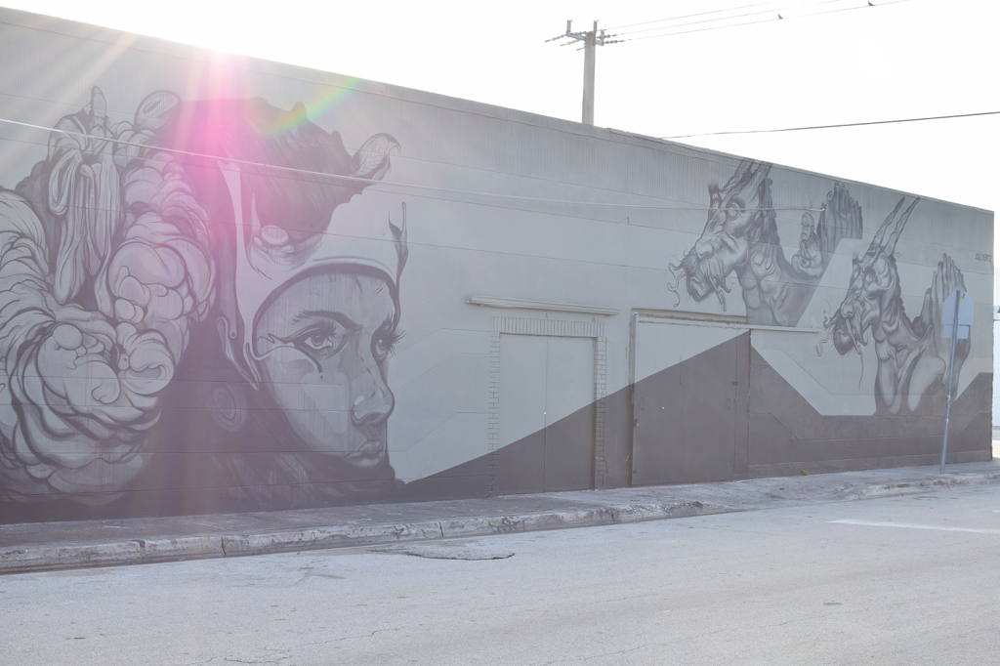

In [6]:
# Load and Show jpg image
size = (1024, 1024)
im_jpg = Image.open("Miami Nov 2015/20151127-DSC_1660.JPG")
im_jpg.thumbnail(size)
print(im_jpg)
display(im_jpg)

<PIL.Image.Image image mode=RGB size=1024x683 at 0x7F34D84CDCF8>


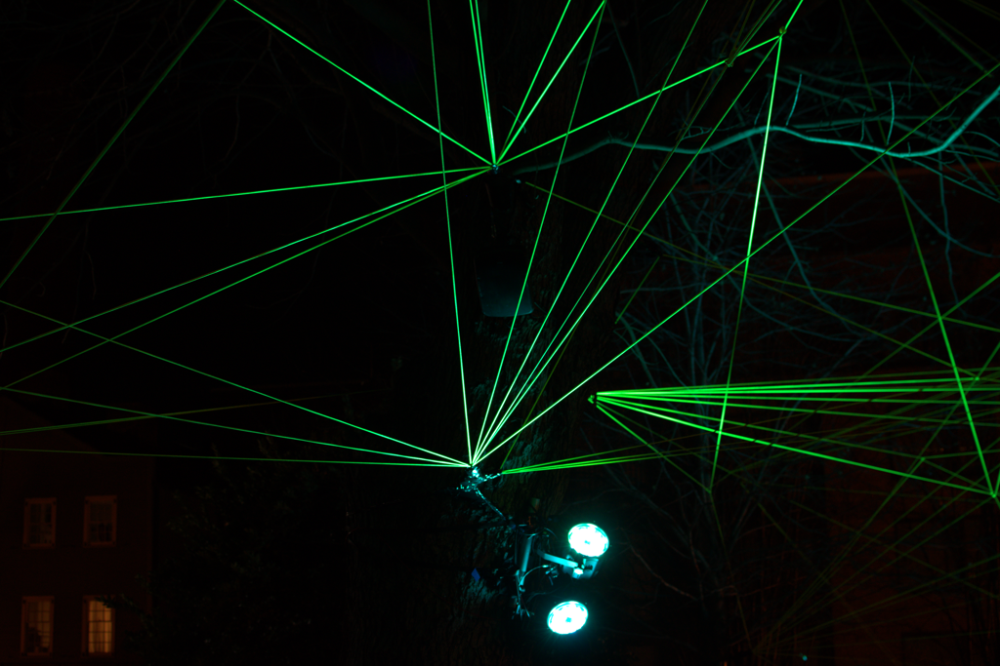

In [7]:
# Load and Show nef image
size = (1024, 1024)
raw_nef = rawpy.imread("Georgetown Glow DC Dec 2018/Georgetown-Glow-DC-Dec2018-001.NEF")
rgb_nef = raw_nef.postprocess()
im_nef = Image.fromarray(rgb_nef) # Pillow image
im_nef.thumbnail(size)
print(im_nef)
display(im_nef)

<PIL.Image.Image image mode=RGB size=1024x683 at 0x7F34D84CDE10>


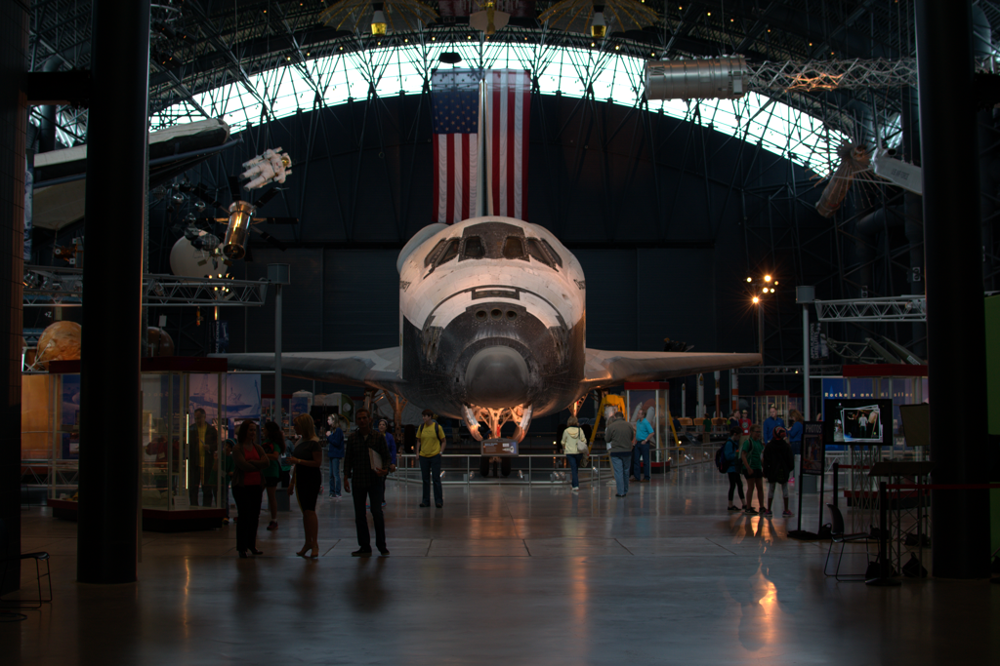

In [8]:
# Load and Show dng image
size = (1024, 1024)
raw_dng = rawpy.imread("DC May 2015/20150501-DSC_0687.dng")
rgb_dng = raw_dng.postprocess()
im_dng = Image.fromarray(rgb_dng) # Pillow image
im_dng.thumbnail(size)
print(im_dng)
display(im_dng)

<PIL.TiffImagePlugin.TiffImageFile image mode=RGB size=1024x576 at 0x7F34D84CDAC8>


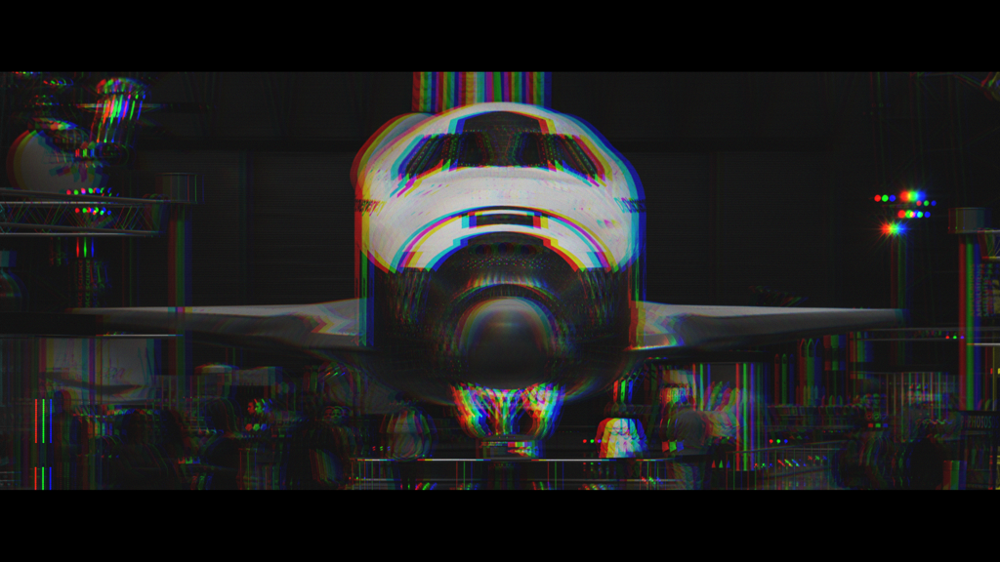

In [9]:
# Load and Show tiff image
size = (1024, 1024)
im_tiff = Image.open("DC May 2015/20150501-DSC_0687-Edit-2.tif")
im_tiff.thumbnail(size)
print(im_tiff)
display(im_tiff)

In [6]:
import os
import sys
print(os.path.basename("DC May 2015/20150501-DSC_0687-Edit-2.tif").split('.')[-1])

tif


In [0]:
def read_raw_img(filename, size=(1024, 1024)):
   raw = rawpy.imread(filename)
   rgb = raw.postprocess()
   im_raw = Image.fromarray(rgb) # Pillow image
   im_raw.thumbnail(size)
   return im_raw

In [0]:
def read_reg_img(filename, size=(1024, 1024)):
   im_reg = Image.open(filename)
   im_reg.thumbnail(size)
   return im_reg

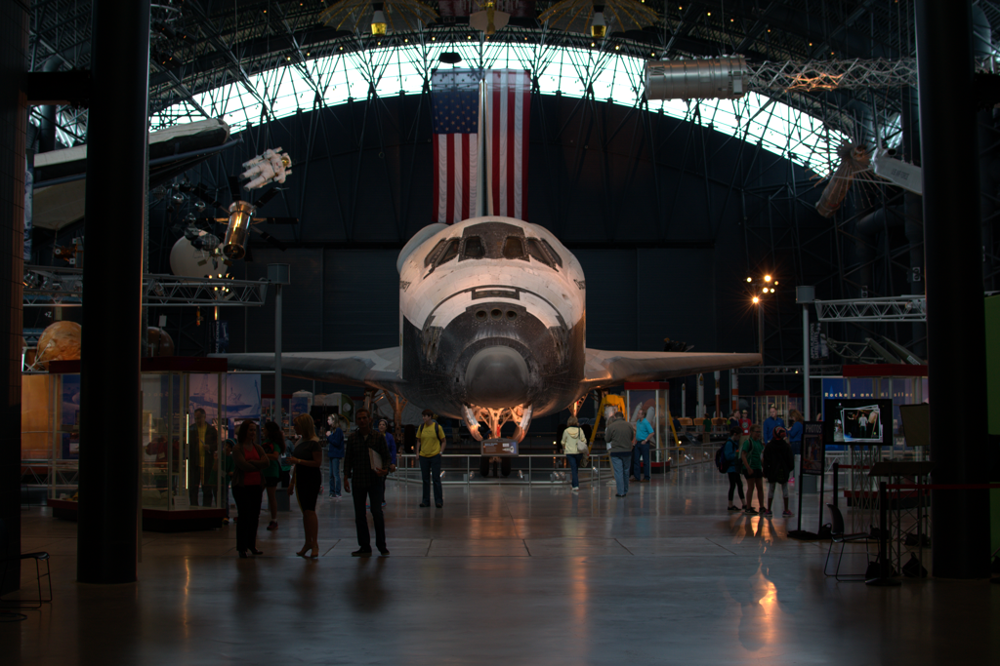

In [9]:
img_raw_test = read_raw_img("DC May 2015/20150501-DSC_0687.dng")
display(img_raw_test)

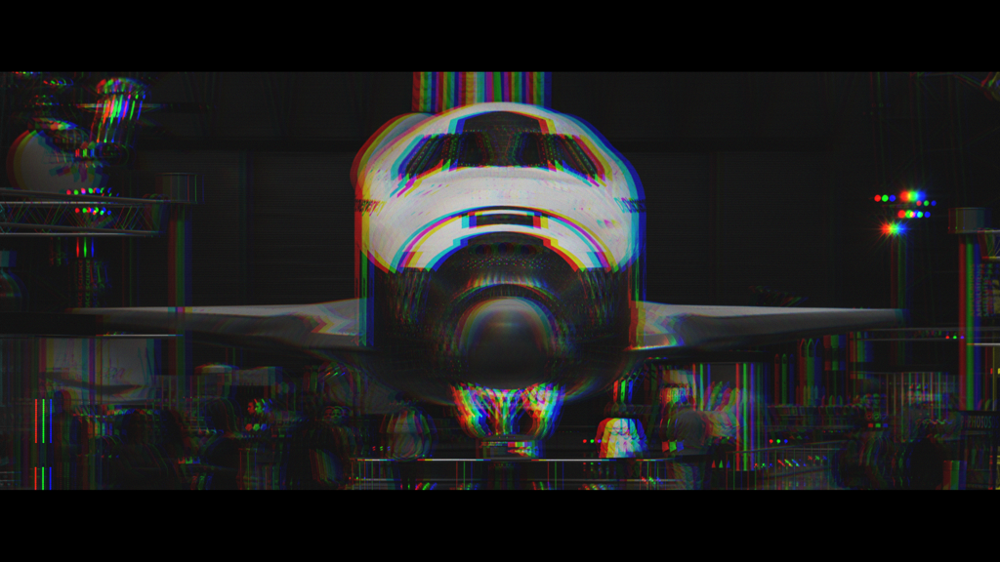

In [14]:
img_reg_test = read_reg_img("DC May 2015/20150501-DSC_0687-Edit-2.tif")
display(img_reg_test)

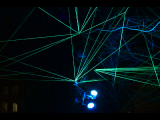

In [15]:
img_raw_reg_test = read_reg_img("Georgetown Glow DC Dec 2018/Georgetown-Glow-DC-Dec2018-001.NEF")
display(img_raw_reg_test)

In [0]:
raw_img_types = ['nef', 'dng']
reg_img_types = ['jpg', 'jpeg', 'png', 'tif', 'tiff']

Make list of all files in images in archive

In [0]:
import glob
import pandas as pd

In [18]:
glob.glob('*/')

['Camera Roll/',
 'Unsorted/',
 'Atlanta/',
 'Testing/',
 'Lightroom/',
 'PostPost/',
 'DC May 2015/',
 'Tampa May 2015/',
 'Chelsi Graduation May 2015/',
 'Miami May 2015/',
 'Penn State Gardens May2015/',
 'Bellefonte Cruise 2015/',
 'Miami and Punta Cana 2015/',
 'Bayside Boat Tour July 2015/',
 'RaybanP G15 Calibration/',
 'Mt. Nittany Hike 2015/',
 'Bald Eagle 2015/',
 'Meteor Shower 2015/',
 'Sept2015_RecruitmentTripDriveToUMBC/',
 'Oct2015_PennStateHomecoming/',
 'DC Oct 2015/',
 'Jo Hayes Vista 2015/',
 'Lightpainting Tests/',
 'Philly Nov 2015/',
 'Milan 2015/',
 'Miami Nov 2015/',
 'Around State College/',
 'Paris NYE Dec 2015/',
 'Paris Dec15 Jan16/',
 'Portfolio/',
 'DC MLK 2016/',
 'BGSA SpringBanquet 2016/',
 'Self Portraits/',
 'Amy PhD Defense/',
 'July 4th 2016/',
 'Spring Creek Canyon State College July 2016/',
 'ArtsFest State College 2016/',
 'State College Car Show July 2016/',
 'Penns Cave Aug 2016/',
 'Amy PhD Graduation/',
 'Spikes Baseball Sept 2016/',
 'Durham

In [0]:
f = []
for (dirpath, dirnames, filenames) in os.walk("."):
   for x in filenames:
      tmp_ext=os.path.basename(x).split('.')[-1]
      tmp_ext_lower = tmp_ext.lower()
      israw = tmp_ext_lower in raw_img_types
      isreg = tmp_ext_lower in reg_img_types
      if israw or isreg:
         f.append(os.path.join(dirpath, x))
   #f.extend(filenames)
   #f.extend(dirnames)
   #break
print(f)
print(len(f))

In [12]:
from keras.applications.resnet50 import ResNet50
from keras.preprocessing import image
from keras.applications.resnet50 import preprocess_input, decode_predictions
from keras.models import Model
from keras.layers import Flatten, Dense, Dropout
from keras.layers import GlobalMaxPooling2D
import numpy as np

### create base_model using ResNet50 trained on imagenet then cut off the average pooling and fully connected layers (using include_top=False)
base_model = ResNet50(weights='imagenet', include_top=False)

### Take base_model, then add a GlobalMaxPooling layer followed by a fully connected layer with 2 output nodes
output_pool = GlobalMaxPooling2D()(base_model.output)

#create graph of new whole model
whole_model = Model(inputs = base_model.input, outputs = output_pool)

#compile the model
whole_model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

### print summary of the model architecture
whole_model.summary()

Using TensorFlow backend.
W0618 13:32:46.969265 139691723892608 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0618 13:32:46.996204 139691723892608 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0618 13:32:47.006668 139691723892608 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4185: The name tf.truncated_normal is deprecated. Please use tf.random.truncated_normal instead.

W0618 13:32:47.039936 139691723892608 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session inste

94658560/94653016 [==============================] - 1s 0us/step


W0618 13:32:59.053110 139691723892608 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.



__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, None, None, 6 256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

In [13]:
### make prediction
img_pred_test = read_reg_img("DC May 2015/20150501-DSC_0687-Edit-2.tif")
x = image.img_to_array(img_pred_test)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

preds = whole_model.predict(x)[0]
print(preds.shape[0])
print(preds)

2048
[ 2.534505   17.063469    0.06325088 ...  2.6236954   9.68988
 10.367573  ]


In [0]:
def make_pred(filename):
   tmp_ext=os.path.basename(filename).split('.')[-1]
   tmp_ext_lower = tmp_ext.lower()
   israw = tmp_ext_lower in raw_img_types
   isreg = tmp_ext_lower in reg_img_types
   if israw:
      img_pred_test = read_raw_img(filename)
   elif isreg:
      img_pred_test = read_reg_img(filename)
   else:
      print("File read error")
      #sys.exit() ### This should probably return a variable of 999s
      return 999*np.ones(preds.shape[0])
   #img_pred_test = read_reg_img(filename) # add if statement for raw type
   x = image.img_to_array(img_pred_test)
   x = np.expand_dims(x, axis=0)
   x = preprocess_input(x)

   return whole_model.predict(x)[0]

In [15]:
print(make_pred("DC May 2015/20150501-DSC_0687-Edit-2.tif"))

[ 2.534505   17.063469    0.06325088 ...  2.6236954   9.68988
 10.367573  ]


In [16]:
print(make_pred("DC May 2015/20150501-DSC_0687.dng"))

[ 5.531656  17.347454   3.9108093 ...  4.016268   5.992802   7.322447 ]


In [17]:
print(make_pred("DC May 2015/20150501-DSC_0687.dngg"))

File read error
[999. 999. 999. ... 999. 999. 999.]


In [0]:
enc = []
count = 0
for fn in f:
   tmp_pred = make_pred(fn)
   enc.append(tmp_pred)
   count += 1
   print("count: %d" % count)
   #if count > 5:
   #   break
  
print(enc)

In [0]:
print(enc)

In [0]:
#np.save('photo_enc_resnet50.npy', enc)
#np.save('photo_path.npy', f)

In [0]:
res_enc = np.load('photo_enc_resnet50.npy')
photo_path = np.load('photo_path.npy')

In [0]:
print(photo_path)

In [0]:
df_path = pd.DataFrame({'path':photo_path})
df_enc = pd.DataFrame(data=res_enc)

In [0]:
print(df_path)

In [0]:
print(df_enc)

In [0]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import scale

In [0]:
scaled_data = scale(df_enc)
print(scaled_data)

In [36]:
sum_of_squared_distances = []
sil_score = []
k_num = range(2,10)
for k in k_num:
    km = KMeans(n_clusters=k)
    #km_pred = km.fit_predict(scaled_data)
    #score = silhouette_score (scaled_data, km_pred)
    km_pred = km.fit_predict(df_enc)
    score = silhouette_score (df_enc, km_pred)
    print('Cluster %d - Inertia %f - Silhouette Score %f' % (k,km.inertia_, score))
    sum_of_squared_distances.append(km.inertia_)
    sil_score.append(score)
    
np.save('cluster_ssd.npy', sum_of_squared_distances)

Cluster 2 - Inertia 431866559.610730 - Silhouette Score 0.070895
Cluster 3 - Inertia 419666424.899606 - Silhouette Score 0.045147
Cluster 4 - Inertia 410364548.227316 - Silhouette Score 0.044450
Cluster 5 - Inertia 404535496.289575 - Silhouette Score 0.036196
Cluster 6 - Inertia 399317158.739361 - Silhouette Score 0.036455
Cluster 7 - Inertia 394561643.203361 - Silhouette Score 0.035162
Cluster 8 - Inertia 390550577.355171 - Silhouette Score 0.035487
Cluster 9 - Inertia 386909790.667518 - Silhouette Score 0.036436


In [0]:
import matplotlib.pyplot as plt

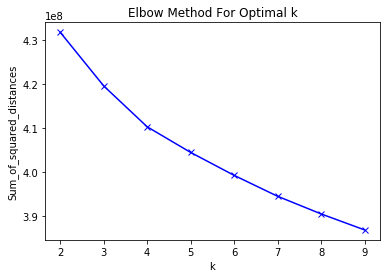

In [38]:
plt.plot(k_num, sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

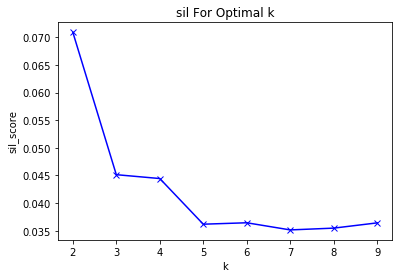

In [39]:
plt.plot(k_num, sil_score, 'bx-')
plt.xlabel('k')
plt.ylabel('sil_score')
plt.title('sil For Optimal k')
plt.show()

In [0]:
km4 = KMeans(n_clusters=4)
photo_pred4 = km4.fit_predict(df_enc)
print('Cluster %d - Inertia %f - Silhouette Score %f' % (4,km4.inertia_, score))

In [41]:
km2 = KMeans(n_clusters=2)
photo_pred2 = km2.fit_predict(df_enc)
print('Cluster %d - Inertia %f - Silhouette Score %f' % (2,km2.inertia_, score))

Cluster 2 - Inertia 431866507.519578 - Silhouette Score 0.036436


In [42]:
km50 = KMeans(n_clusters=50)
photo_pred50 = km50.fit_predict(df_enc)
print('Cluster %d - Inertia %f - Silhouette Score %f' % (50,km50.inertia_, score))

Cluster 50 - Inertia 328388154.353222 - Silhouette Score 0.036436


In [0]:
df_path_vec = df_path.merge(df_enc, left_index=True, right_index=True)
print(df_path_vec)

In [0]:
print(photo_pred4)

In [0]:
df_photo_pred = pd.DataFrame(photo_pred4)
print(df_photo_pred)

In [0]:
df_path_pred = df_path_vec.merge(df_photo_pred, left_index=True, right_index=True)
print(df_path_pred)

In [0]:
from sklearn.decomposition import PCA

In [31]:
pca = PCA(n_components=2)
pca_photo = pca.fit_transform(df_enc)
print(pca.explained_variance_ratio_)
print(np.sum(pca.explained_variance_ratio_))

[0.10871482 0.04158661]
0.15030142677162464


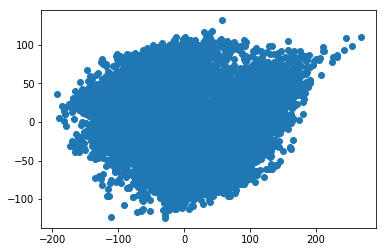

In [34]:
plt.scatter(pca_photo[:,0],pca_photo[:,1])
plt.show()

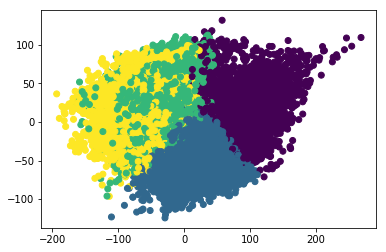

In [35]:
#plt.scatter(pca_photo[:,0],pca_photo[:,1])
plt.scatter(pca_photo[:,0],pca_photo[:,1],c=photo_pred4)
plt.show()

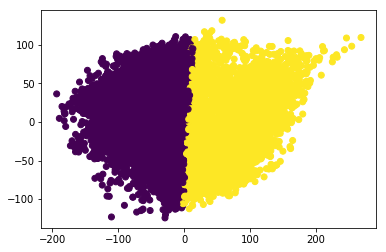

In [47]:
plt.scatter(pca_photo[:,0],pca_photo[:,1],c=photo_pred2)
plt.show()

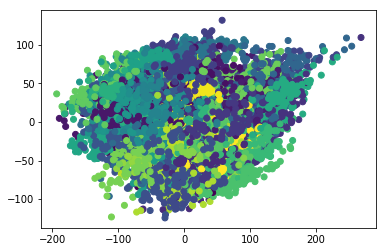

In [48]:
plt.scatter(pca_photo[:,0],pca_photo[:,1],c=photo_pred50)
plt.show()

In [36]:
print(df_path_pred[df_path_pred['0_y']==3].index)

Int64Index([  44,   48,   58,   70,   85,  173,  192,  193,  195,  196,
            ...
            8453, 8454, 8455, 8456, 8457, 8458, 8459, 8470, 8471, 8472],
           dtype='int64', length=1769)


In [0]:
idx0 = df_path_pred[df_path_pred['0_y']==0].index
idx1 = df_path_pred[df_path_pred['0_y']==1].index
idx2 = df_path_pred[df_path_pred['0_y']==2].index
idx3 = df_path_pred[df_path_pred['0_y']==3].index

In [0]:
import random

439
./Atlanta/DSC_0341.JPG


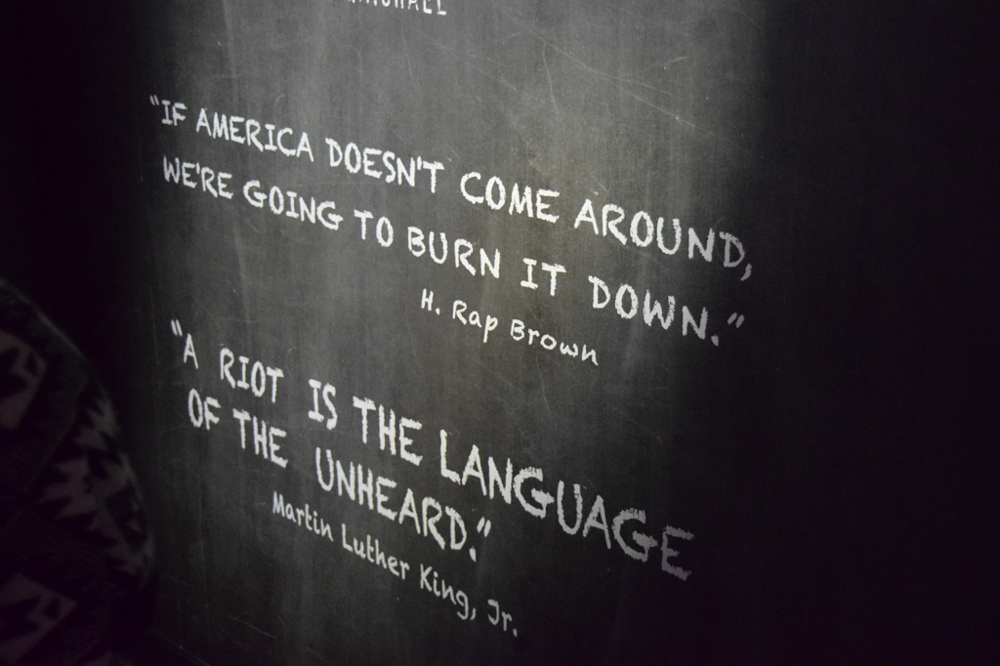

In [47]:
ridx0 = random.choice(idx0)
print(ridx0)
path_ridx0 = df_path_pred.iloc[ridx0]['path']
print(path_ridx0)
tmp_ext=os.path.basename(path_ridx0).split('.')[-1]
tmp_ext_lower = tmp_ext.lower()
israw = tmp_ext_lower in raw_img_types
isreg = tmp_ext_lower in reg_img_types
if israw:
   img_pred_test = read_raw_img(path_ridx0)
elif isreg:
   img_pred_test = read_reg_img(path_ridx0)
display(img_pred_test)

(-0.5, 1023.5, 681.5, -0.5)

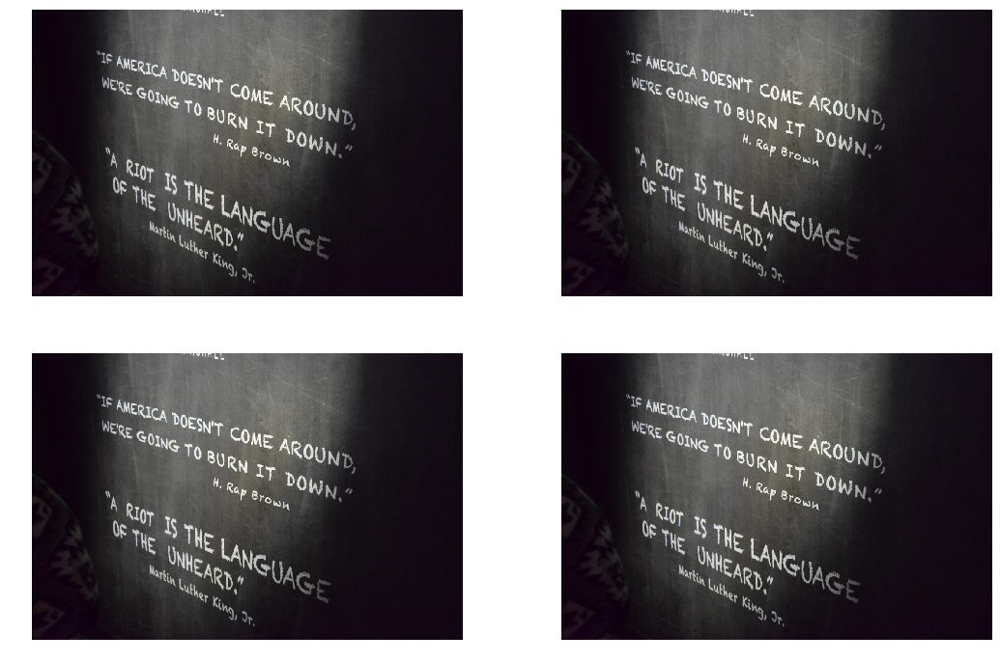

In [59]:
f, axarr = plt.subplots(2,2, figsize=(18, 12))
axarr[0,0].imshow(img_pred_test)
axarr[0,1].imshow(img_pred_test)
axarr[1,0].imshow(img_pred_test)
axarr[1,1].imshow(img_pred_test)

axarr[0,0].axis('off')
axarr[0,1].axis('off')
axarr[1,0].axis('off')
axarr[1,1].axis('off')


In [60]:
ridx0 = random.choices(idx0, k=4)
print(ridx0)

[1415, 7390, 2859, 1800]


In [0]:
def cluster_grab(cluster):
    idx = df_path_pred[df_path_pred['0_y']==cluster].index
    ridx = random.choices(idx, k=4)
    img_sav = []
    for x in range(4):
        ridx0 = ridx[x]
        path_ridx0 = df_path_pred.iloc[ridx0]['path']
        print(path_ridx0)
        tmp_ext=os.path.basename(path_ridx0).split('.')[-1]
        tmp_ext_lower = tmp_ext.lower()
        israw = tmp_ext_lower in raw_img_types
        isreg = tmp_ext_lower in reg_img_types
        if israw:
            img_pred_test = read_raw_img(path_ridx0)
        elif isreg:
            img_pred_test = read_reg_img(path_ridx0)
        img_sav.append(img_pred_test)
    
    f, axarr = plt.subplots(2,2, figsize=(18, 12))
    axarr[0,0].imshow(img_sav[0])
    axarr[0,1].imshow(img_sav[1])
    axarr[1,0].imshow(img_sav[2])
    axarr[1,1].imshow(img_sav[3])

    axarr[0,0].axis('off')
    axarr[0,1].axis('off')
    axarr[1,0].axis('off')
    axarr[1,1].axis('off')
   

./Penns Cave Aug 2016/DSC_2981.NEF
./St Kitts Chelsi White Coat Jan 2019/Chelsi-WhiteCoat-StKitts-Jan2019-111.NEF
./DC Arlington Cem Nat History 2017/DC Arlington Cem Nat History 2017-060.NEF
./July 4th 2016/DSC_2744.NEF


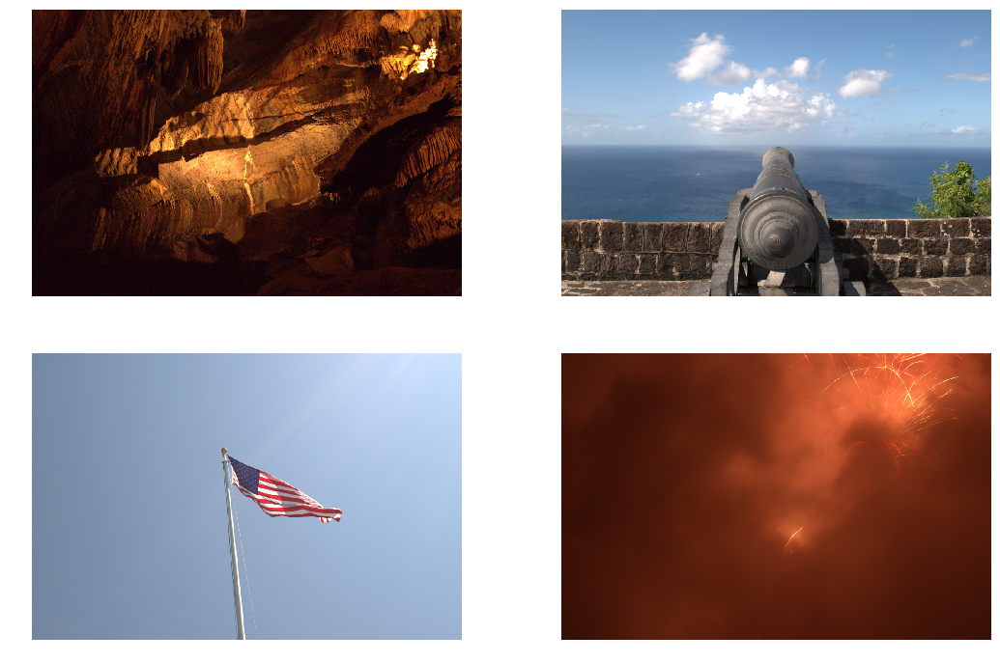

In [64]:
cluster_grab(0)

./BudaPrague Oct 2018/Budapest-458.NEF
./DC American History Museum June 2018/American-History-Smithsonian-047.NEF
./MarchForOurLives DC 2018/MarchForOurLives-161.NEF
./BudaPrague Oct 2018/Budapest-081.NEF


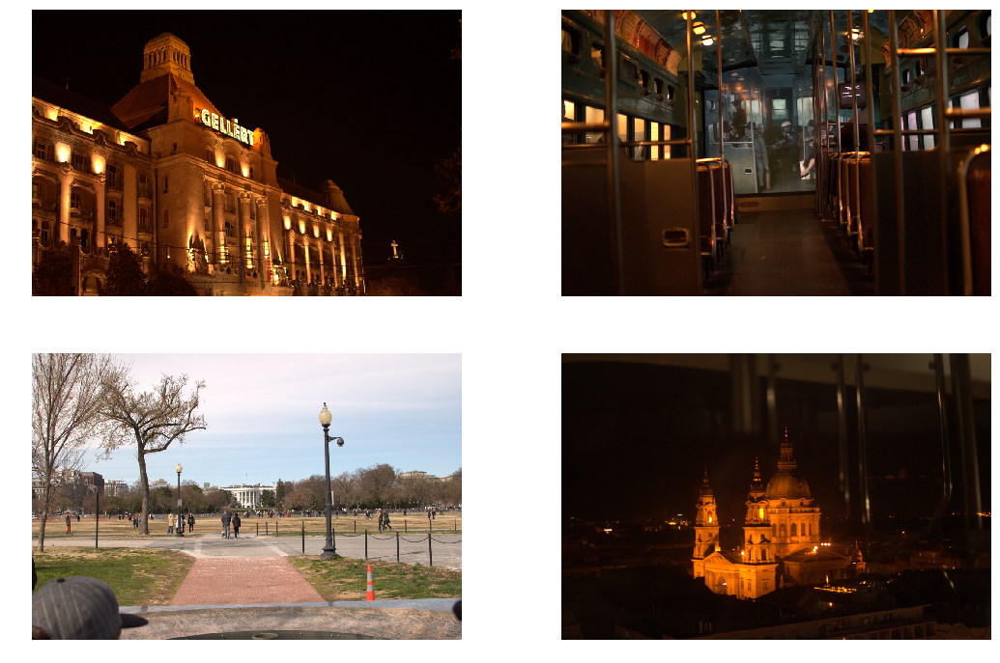

In [68]:
cluster_grab(1)

./Intel Portland 2017/Portland 2017-034.NEF
./Blind Whino Feb 2019/Blind-Whino-HipHop-Museum-Feb2019-015.NEF
./Ley Philly 2017/LeyPhilly-151.NEF
./Byron PhD Graduation Aug 2018/Byron-PhD-Graduation-11Aug2018-588.NEF


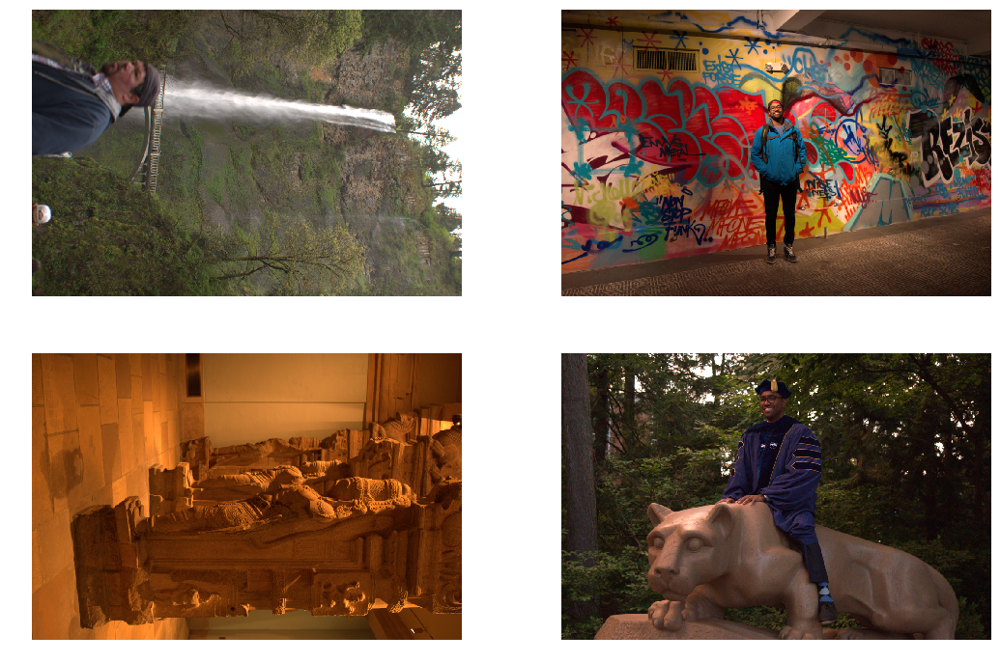

In [75]:
cluster_grab(2)

./Womens March DC 2017/WomensMarchDC_21Jan2017-143.NEF
./Byron PhD Graduation Aug 2018/Byron-PhD-Graduation-11Aug2018-107.NEF
./MarchForOurLives DC 2018/MarchForOurLives-039.NEF
./BudaPrague Oct 2018/Budapest-040.NEF


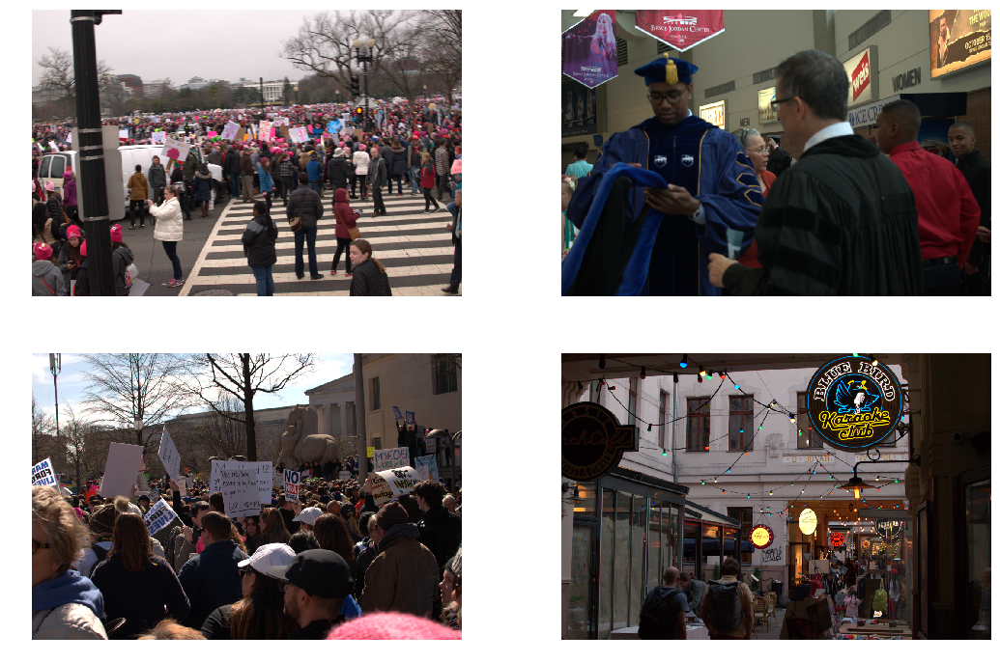

In [78]:
cluster_grab(3)